In [ ]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from pandas_profiling import ProfileReport                           

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
hotel_path = '/content/drive/MyDrive/Naya-Projects/Classification-project/hotel_bookings.csv'
df_hotel = pd.read_csv(hotel_path)

In [ ]:
profile = ProfileReport(df_hotel, title="Pandas Profiling Report", explorative=True)

In [ ]:
#profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df_hotel.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [ ]:
#checking the data information
df_hotel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype   
---  ------                          --------------   -----   
 0   hotel                           119390 non-null  category
 1   is_canceled                     119390 non-null  int64   
 2   lead_time                       119390 non-null  int64   
 3   arrival_date_year               119390 non-null  int64   
 4   arrival_date_month              119390 non-null  int64   
 5   arrival_date_week_number        119390 non-null  int64   
 6   arrival_date_day_of_month       119390 non-null  int64   
 7   stays_in_weekend_nights         119390 non-null  int64   
 8   stays_in_week_nights            119390 non-null  int64   
 9   adults                          119390 non-null  int64   
 10  children                        119390 non-null  int64   
 11  babies                          119390 non-null  int64   
 12  me

In [ ]:
#calculating the missing value in each column
df_hotel.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

In [ ]:
# country is a 3 digit country code, fill na with "Unknown" string
df_hotel.fillna("UNKNOWN",inplace=True)
#agent is int id of the agent , fill na with 0
df_hotel.agent.fillna(0,inplace=True)
#company is int id of the company , fill na with 0
df_hotel.company.fillna(0,inplace=True)
#children is int id of num of children , fill na with 0
df_hotel.children.fillna(0,inplace=True)
df_hotel.children[df_hotel.children == 'UNKNOWN'] = 0
df_hotel.children = df_hotel.children.astype(int)
#fix negative adr
df_hotel.loc[df_hotel.adr<0,'adr'] = 0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


In [ ]:
df_hotel.hotel =df_hotel.hotel.astype('str')
df_hotel.meal  =df_hotel.meal.astype('str')
df_hotel.country =df_hotel.country.astype('str')
df_hotel.market_segment = df_hotel.market_segment.astype('str')
df_hotel.distribution_channel  =df_hotel.distribution_channel.astype('str')
df_hotel.reserved_room_type =df_hotel.reserved_room_type.astype('str')
df_hotel.assigned_room_type =df_hotel.assigned_room_type.astype('str')   
df_hotel.deposit_type =df_hotel.deposit_type.astype('str')
df_hotel.agent = df_hotel.agent.astype('str') 
df_hotel.company = df_hotel.company.astype('str')             
df_hotel.customer_type   = df_hotel.customer_type.astype('str')    
df_hotel.reservation_status   = df_hotel.reservation_status.astype('str')    
df_hotel.reservation_status_date  = df_hotel.reservation_status_date.astype('str')

df_hotel.adr=df_hotel.adr.astype('int')

In [ ]:
#converting the required object type feature to categorical
categorical_features = ['hotel','arrival_date_week_number','meal','country','market_segment',
                        'distribution_channel','is_repeated_guest','reserved_room_type','assigned_room_type',
                        'deposit_type','agent','customer_type','reservation_status','arrival_date_month']
df_hotel[categorical_features]=df_hotel[categorical_features].astype('str')
df_hotel.adr=df_hotel.adr.astype('int')

In [ ]:
import datetime
def convert_month_text_to_int(month):
  return datetime.datetime.strptime(month, "%B").month

df_hotel.arrival_date_month = df_hotel.arrival_date_month.apply(convert_month_text_to_int)
#datetime_object = datetime.datetime.strptime(long_month_name, "%B")

## converting company id to "is-comapny" - true false
df_hotel.company = df_hotel.company!='UNKNOWN'

## converting agent id to "is ordered with agent" - true false
df_hotel.agent = df_hotel.agent!='UNKNOWN'

In [ ]:
df_hotel.arrival_date_month

0         7
1         7
2         7
3         7
4         7
         ..
119385    8
119386    8
119387    8
119388    8
119389    8
Name: arrival_date_month, Length: 119390, dtype: object

In [ ]:
df_hotel.groupby(['country'])['is_canceled'].count()

country
ABW      2
AGO    362
AIA      1
ALB     12
AND      7
      ... 
VGB      1
VNM      8
ZAF     80
ZMB      2
ZWE      4
Name: is_canceled, Length: 178, dtype: int64

In [ ]:
#dates=pd.to_datetime()
#df_hotel["arraival_date"] =  pd.to_datetime((df_hotel.arrival_date_year) +"-"+ (df_hotel.arrival_date_month)+"-"+ (df_hotel.arrival_date_day_of_month))

from  datetime import datetime

df_hotel["arraival_date"] = df_hotel.apply(lambda x:datetime.strptime("{0} {1} {2}".format(x['arrival_date_year'],x['arrival_date_month'], x['arrival_date_day_of_month']), "%Y %m %d").strftime('%A'),axis=1)


In [ ]:
df_hotel["arraival_date"].head(1)

2    Wednesday
Name: arraival_date, dtype: object

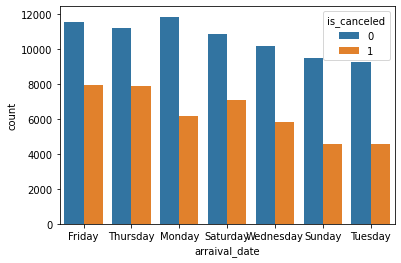

In [ ]:
sns.countplot(order = df_hotel['arraival_date'].value_counts().index, data=df_hotel, x='arraival_date', hue='is_canceled')

In [ ]:
df_temp.groupby(['arraival_date'])['is_canceled'].mean().sort_values().plot(kind="bar")

In [ ]:
pd.set_option('display.max_columns', None)


In [ ]:
#df_hotel[df_hotel[(df_hotel.stays_in_week_nights<=0)] and df_hotel[(df_hotel.stays_in_weekend_nights<=0)]]
to_drop=df_hotel[(df_hotel['stays_in_weekend_nights']==0) & (df_hotel['stays_in_week_nights']==0)]
df_hotel = df_hotel.drop(index=to_drop.index)

Cancelations in resort hotel=  0.28001814699062405
Cancelations in city hotel=  0.4187268193268269


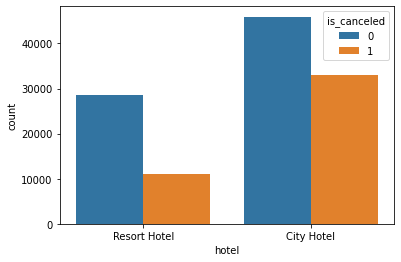

In [ ]:
sns.countplot(data=df_hotel, x='hotel', hue='is_canceled')
resort_canceled = df_hotel[(df_hotel['hotel']=='Resort Hotel') & (df_hotel['is_canceled']==1)]
city_canceled = df_hotel[(df_hotel['hotel']=='City Hotel') & (df_hotel['is_canceled']==1)]
print('Cancelations in resort hotel= ', (len(resort_canceled))/(len(df_hotel[df_hotel['hotel']=='Resort Hotel'])))
print('Cancelations in city hotel= ', (len(city_canceled))/(len(df_hotel[df_hotel['hotel']=='City Hotel'])))


Cancelations among new guests=  0.3789007554050534
Cancelations among old guests=  0.15720399429386592


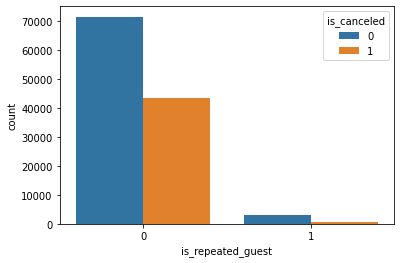

In [ ]:
sns.countplot(data=df_hotel, x='is_repeated_guest', hue='is_canceled')
new_guest = df_hotel[(df_hotel['is_repeated_guest']==0) & (df_hotel['is_canceled']==1)]
old_guest = df_hotel[(df_hotel['is_repeated_guest']==1) & (df_hotel['is_canceled']==1)]
print('Cancelations among new guests= ', (len(new_guest))/(len(df_hotel[df_hotel['is_repeated_guest']==0])))
print('Cancelations among old guests= ', (len(old_guest))/(len(df_hotel[df_hotel['is_repeated_guest']==1])))


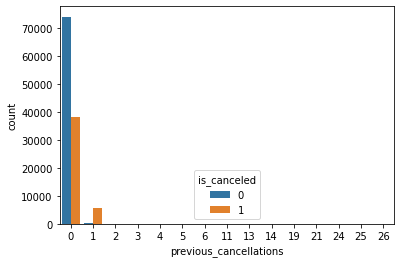

In [ ]:
sns.countplot(data=df_hotel, x='previous_cancellations', hue='is_canceled')

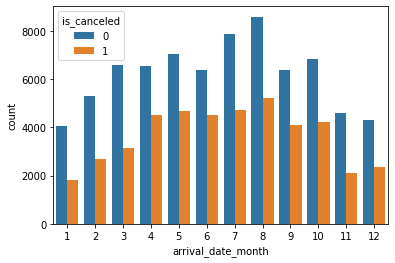

In [ ]:
sns.countplot(data=df_hotel, x='arrival_date_month', hue='is_canceled')

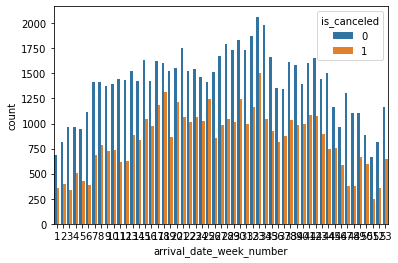

In [ ]:
sns.countplot(data=df_hotel, x='arrival_date_week_number', hue='is_canceled')

In [ ]:
filterx = df_hotel.groupby(['hotel','reserved_room_type'])
df_test_reserved_room_type  = filterx.filter(lambda x: x['hotel'].count()>0)
df_test_reserved_room_type.groupby(['hotel','reserved_room_type'])['is_canceled'].mean().sort_values(ascending=True).plot(kind='bar')

In [ ]:
filterx = df_hotel.groupby(['reserved_room_type'])
df_test_reserved_room_type  = filterx.filter(lambda x: x['is_canceled'].count()>500)
df_test_reserved_room_type.groupby(['reserved_room_type'])['is_canceled'].mean().sort_values(ascending=True).plot(kind='bar')
get_dummies_reserved_room_type_filter = list(set(df_test_country.reserved_room_type))
df_hotel['reserved_room_type'] = np.where(df_hotel['reserved_room_type'].isin(get_dummies_reserved_room_type_filter) ,df_hotel['reserved_room_type'],"other")

In [ ]:
df_hotel.reserved_room_type.value_counts()

A    85994
D    19201
E     6535
F     2897
G     2094
B     1118
C      932
H      601
P       12
L        6
Name: reserved_room_type, dtype: int64

In [ ]:
filterx = df_hotel.groupby(['country'])
df_test_country  = filterx.filter(lambda x: x['is_canceled'].count()>1000)
df_test_country.groupby(['country'])['is_canceled'].mean().sort_values(ascending=True).plot(kind='bar')
get_dummies_country_filter = list(set(df_test_country.country))

df_hotel['country'] = np.where(df_hotel['country'].isin(get_dummies_country_filter) ,df_hotel['country'],"other")

In [ ]:
get_dummies_country_filter

['ITA',
 'PRT',
 'CN',
 'ESP',
 'SWE',
 'BEL',
 'AUT',
 'FRA',
 'NLD',
 'USA',
 'CHE',
 'BRA',
 'DEU',
 'IRL',
 'GBR']

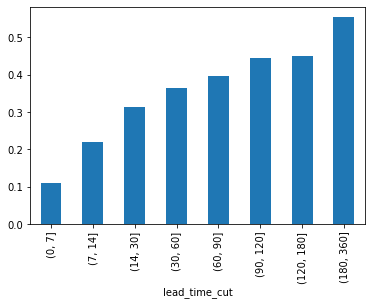

In [ ]:
df_temp = df_hotel
df_temp["lead_time_cut"] =pd.cut (df_temp["lead_time"],bins=[0,7,14,30,60,90,120,180,360])

df_temp.groupby(['lead_time_cut'])['is_canceled'].mean().plot(kind="bar")

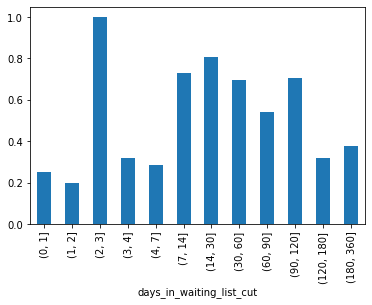

In [ ]:

df_temp = df_hotel
df_temp["days_in_waiting_list_cut"] =pd.cut (df_temp["days_in_waiting_list"],bins=[0,1,2,3,4,7,14,30,60,90,120,180,360])

df_temp.groupby(['days_in_waiting_list_cut'])['is_canceled'].mean().plot(kind="bar")

In [ ]:
df_temp[df_temp.days_in_waiting_list>30]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,days_in_waiting_list_cut
2272,Resort Hotel,0,59,2015,10,41,8,0,3,2,0,0,BB,PRT,Corporate,Corporate,0,0,0,A,A,0,No Deposit,True,False,50,Contract,45,0,0,Check-Out,2015-10-11,"(30.0, 60.0]"
2486,Resort Hotel,0,47,2015,10,43,19,1,4,2,0,0,HB,ESP,Groups,Direct,0,0,0,A,A,0,No Deposit,False,False,47,Transient-Party,76,0,0,Check-Out,2015-10-24,"(30.0, 60.0]"
2487,Resort Hotel,0,47,2015,10,43,19,1,4,2,0,0,HB,ESP,Groups,Direct,0,0,0,A,A,0,No Deposit,False,False,47,Transient-Party,76,0,0,Check-Out,2015-10-24,"(30.0, 60.0]"
2488,Resort Hotel,0,47,2015,10,43,19,1,4,2,0,0,HB,ESP,Groups,Direct,0,0,0,A,A,0,No Deposit,False,False,47,Transient-Party,76,0,0,Check-Out,2015-10-24,"(30.0, 60.0]"
2490,Resort Hotel,0,47,2015,10,43,19,1,4,2,0,0,HB,ESP,Groups,Direct,0,0,0,A,A,0,No Deposit,False,False,47,Transient-Party,76,0,0,Check-Out,2015-10-24,"(30.0, 60.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110996,City Hotel,0,113,2017,5,18,2,0,3,2,0,0,BB,PRT,Groups,Corporate,0,0,0,A,A,1,No Deposit,False,True,46,Transient-Party,120,0,0,Check-Out,2017-05-05,"(30.0, 60.0]"
111263,City Hotel,0,273,2017,5,18,5,1,2,2,0,0,BB,FRA,Groups,TA/TO,0,0,0,A,A,0,No Deposit,True,False,84,Transient-Party,100,0,1,Check-Out,2017-05-08,"(60.0, 90.0]"
111978,City Hotel,0,345,2017,5,19,13,2,3,2,0,0,BB,MOZ,Offline TA/TO,TA/TO,0,0,0,A,A,1,No Deposit,True,False,36,Transient-Party,89,0,0,Check-Out,2017-05-18,"(30.0, 60.0]"
112822,City Hotel,0,344,2017,5,21,27,1,1,2,0,0,BB,PRT,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,True,False,98,Transient-Party,128,0,1,Check-Out,2017-05-29,"(90.0, 120.0]"


In [ ]:
grid = sns.FacetGrid(df_hotel, col='is_canceled')
grid.map(plt.hist, 'lead_time', width=50)
grid.add_legend()


In [ ]:
##
temp = df_hotel.loc[df_hotel.reserved_room_type != df_hotel.assigned_room_type]
temp.is_canceled.value_counts(normalize=True) * 100

#temp = df_hotel.loc[df_hotel.reserved_room_type == df_hotel.assigned_room_type]
#temp.is_canceled.value_counts(normalize=True) * 100


0    94.623584
1     5.376416
Name: is_canceled, dtype: float64

147

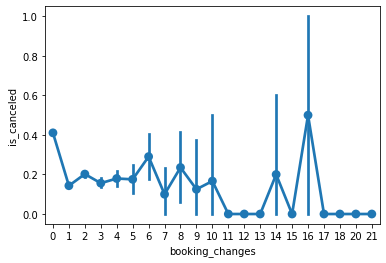

In [ ]:
sns.pointplot(data=df_hotel, x= 'booking_changes', y='is_canceled')
df_hotel.loc[df_hotel.booking_changes >5]["hotel"].count()

In [ ]:
df_hotel["is_booking_changed"] = df_hotel.booking_changes >0
df_hotel.drop(labels= ["booking_changes"], axis=1,inplace=True)

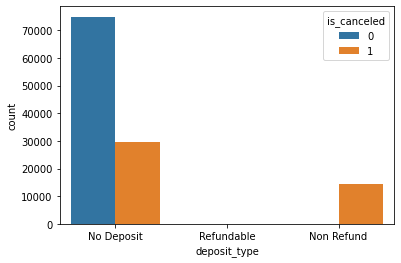

In [ ]:
sns.countplot(x="deposit_type",hue="is_canceled",data=df_hotel)

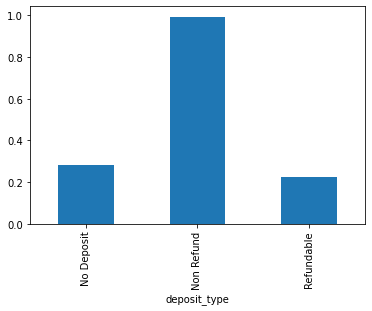

In [ ]:

df_temp.groupby(['deposit_type'])['is_canceled'].mean().plot(kind="bar")

In [ ]:
df_test_country["filtered_country"])

0         PRT
1         PRT
2         GBR
3         GBR
4         GBR
         ... 
119385    BEL
119386    FRA
119387    DEU
119388    GBR
119389    DEU
Name: filtered_country, Length: 108193, dtype: object

Text(0.5, 0, 'Feature Importances (%)')

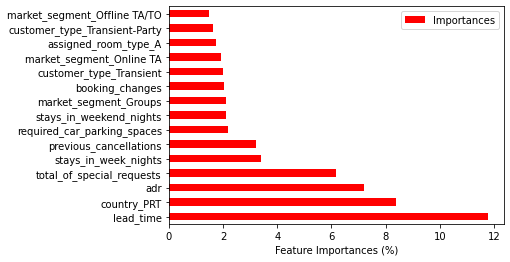

In [ ]:
randomf = RandomForestClassifier()
#X_train = pd.DataFrame(X_train)
rf_model1 = randomf.fit(X_train, y_train)

pd.DataFrame(data = rf_model1.feature_importances_*100,
                   columns = ["Importances"],index = X_train.columns).sort_values("Importances", ascending = False)[:15].plot(kind = "barh", color = "r")

plt.xlabel("Feature Importances (%)")


In [ ]:
X_train.head()

,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,hotel-Resort Hotel,arrival_date_month-August,arrival_date_month-December,arrival_date_month-February,arrival_date_month-January,arrival_date_month-July,arrival_date_month-June,arrival_date_month-March,arrival_date_month-May,arrival_date_month-November,arrival_date_month-October,arrival_date_month-September,meal-FB,meal-HB,meal-SC,meal-Undefined,country-BEL,country-BRA,country-CHE,country-CN,country-DEU,...,country-NLD,country-PRT,country-SWE,country-USA,country-other,market_segment-Complementary,market_segment-Corporate,market_segment-Direct,market_segment-Groups,market_segment-Offline TA/TO,market_segment-Online TA,market_segment-Undefined,distribution_channel-Direct,distribution_channel-GDS,distribution_channel-TA/TO,distribution_channel-Undefined,reserved_room_type-B,reserved_room_type-C,reserved_room_type-D,reserved_room_type-E,reserved_room_type-F,reserved_room_type-G,reserved_room_type-H,reserved_room_type-other,assigned_room_type-B,assigned_room_type-C,assigned_room_type-D,assigned_room_type-E,assigned_room_type-F,assigned_room_type-G,assigned_room_type-H,assigned_room_type-I,assigned_room_type-K,assigned_room_type-L,assigned_room_type-P,deposit_type-Non Refund,deposit_type-Refundable,customer_type-Group,customer_type-Transient,customer_type-Transient-Party
36076,70,2017,18,2,2,5,1,0,0,0,0,0,0,True,False,0,44,0,2,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
73032,123,2017,32,12,2,3,3,0,0,0,0,0,0,True,False,0,177,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
95019,8,2016,33,11,0,2,2,0,0,0,0,0,0,True,False,0,139,0,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
85269,16,2016,11,11,0,1,1,0,0,0,0,0,1,False,True,0,75,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
110908,12,2017,18,1,1,2,1,1,0,0,0,0,0,True,False,0,117,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0


In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 83573 entries, 36076 to 11590
Data columns (total 86 columns):
 #   Column                          Non-Null Count  Dtype
---  ------                          --------------  -----
 0   lead_time                       83573 non-null  int64
 1   arrival_date_year               83573 non-null  int64
 2   arrival_date_week_number        83573 non-null  int64
 3   arrival_date_day_of_month       83573 non-null  int64
 4   stays_in_weekend_nights         83573 non-null  int64
 5   stays_in_week_nights            83573 non-null  int64
 6   adults                          83573 non-null  int64
 7   children                        83573 non-null  int64
 8   babies                          83573 non-null  int64
 9   is_repeated_guest               83573 non-null  int64
 10  previous_cancellations          83573 non-null  int64
 11  previous_bookings_not_canceled  83573 non-null  int64
 12  booking_changes                 83573 non-null  int64
 1

In [ ]:
dftemp = df_hotel
dftemp["is_PRT"] = dftemp.country=="PRT"

In [ ]:
dftemp = df_hotel
dftemp["is_GBR"] = dftemp.country=="GBR"

In [ ]:
dftemp['is_canceled']=dftemp['is_canceled'].astype(int)

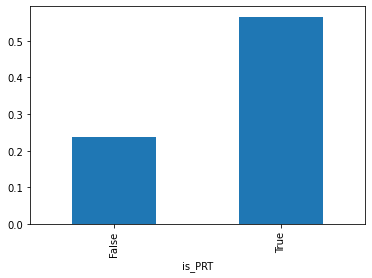

In [ ]:
dftemp.groupby(['is_PRT'])['is_canceled'].mean().plot(kind='bar')


In [ ]:
dftemp.groupby(['is_GBR','is_canceled'])['country'].count()

is_PRT  is_canceled
False   0              54095
        1              16705
True    0              21071
        1              27519
Name: country, dtype: int64

In [ ]:
pip install mljar-supervised

In [ ]:
pip install pandas --upgrade

In [ ]:
pip install pandas==1.2.0

Linear algorithm was disabled.
AutoML directory: AutoML_39
The task is binary_classification with evaluation metric logloss
AutoML will use algorithms: ['Baseline', 'Decision Tree', 'Random Forest', 'Xgboost', 'Neural Network']
AutoML will ensemble available models
AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 2 models
There was an error during 1_Baseline training.
Please check AutoML_39/errors.md for details.
cannot import name 'CompressionOptions' from 'pandas._typing' (/usr/local/lib/python3.7/dist-packages/pandas/_typing.py)
Problem during computing permutation importance. Skipping ...
Exception while producing SHAP explanations. cannot import name 'CompressionOptions' from 'pandas._typing' (/usr/local/lib/python3.7/dist-packages/pandas/_typing.py)
Continuing ...
There was an error during 2_DecisionTree training.
Please check AutoML_39/errors.md for details.
* Step default_algorithms will try to check up to 3 

ImportError: ignored

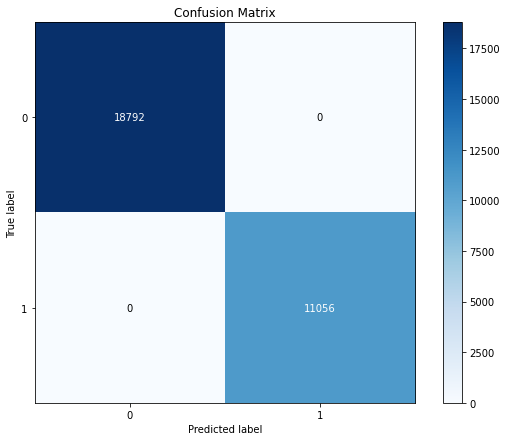

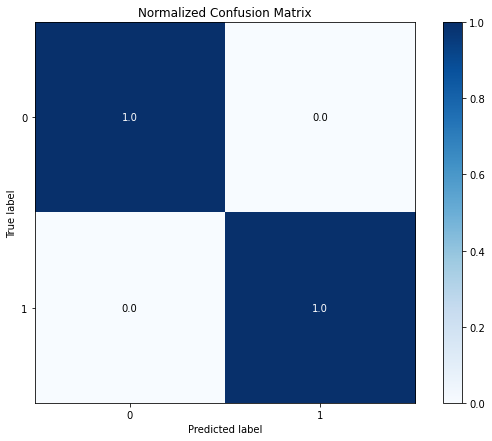

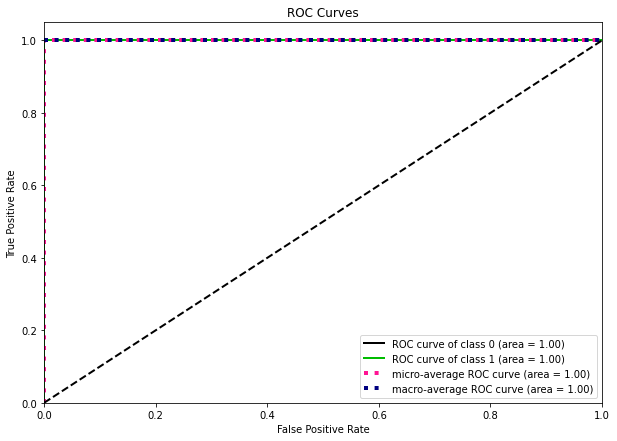

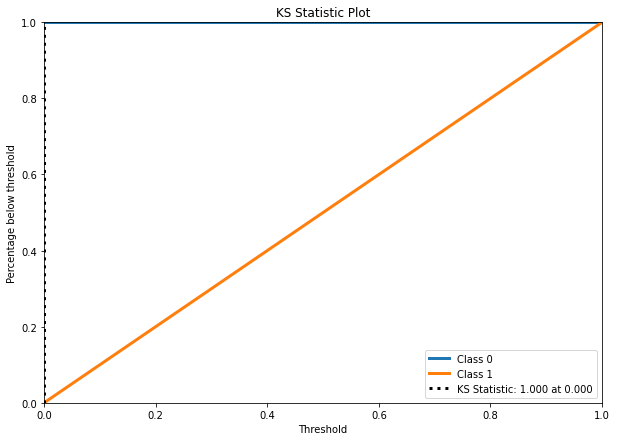

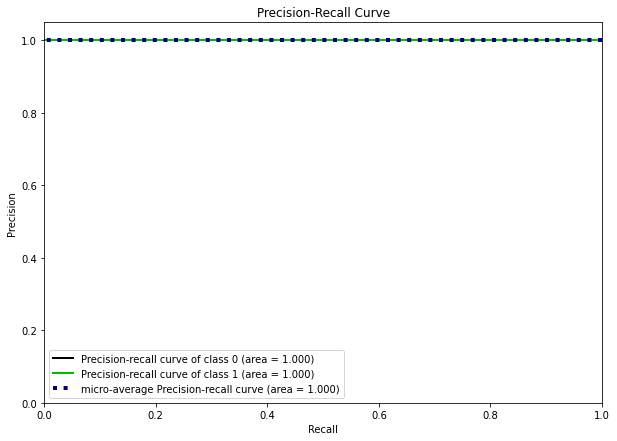

...

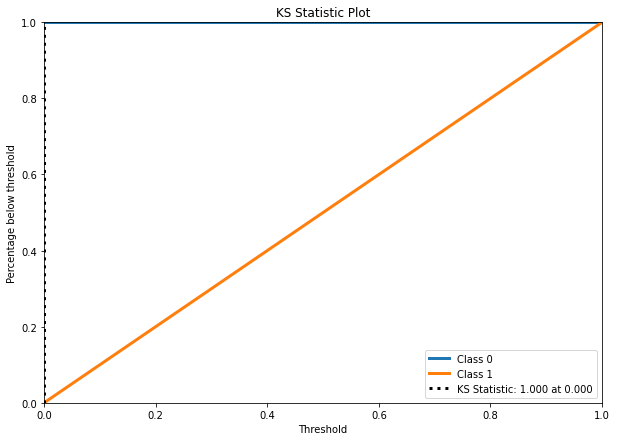

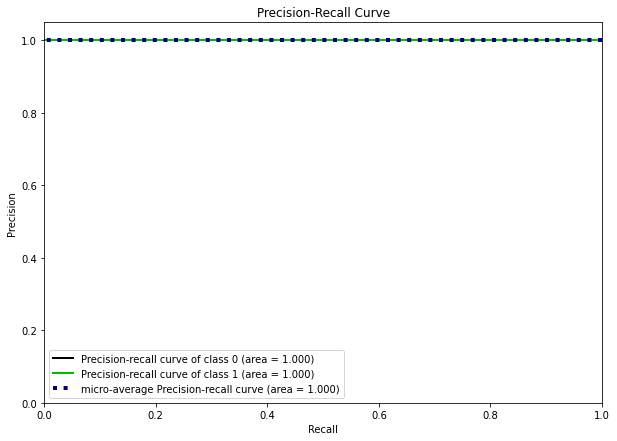

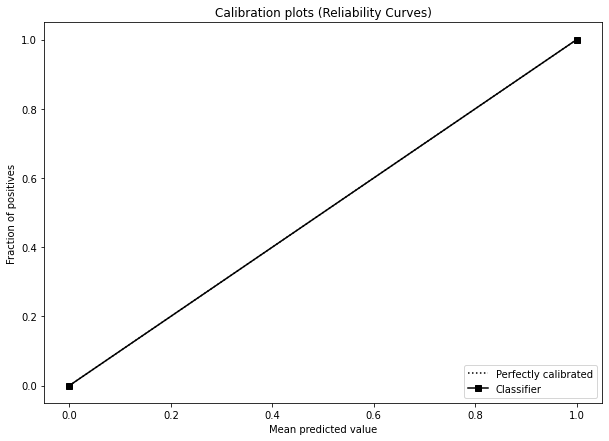

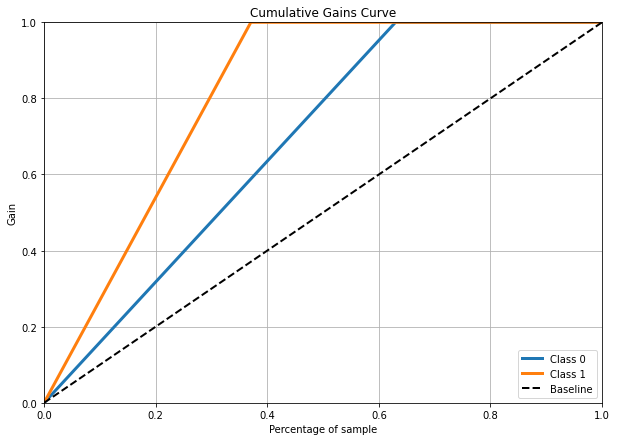

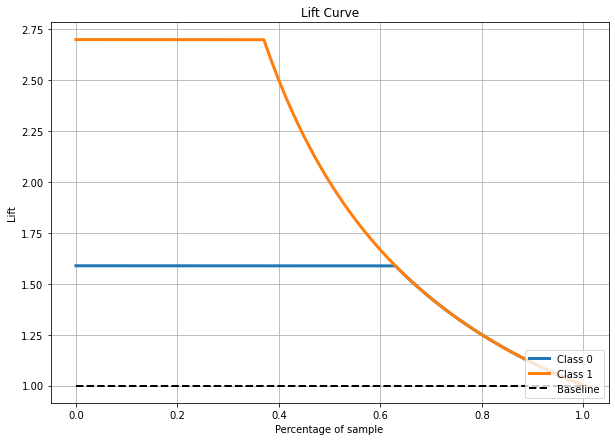

In [ ]:
from sklearn.metrics import accuracy_score
from supervised import AutoML

X = df_hotel.drop(labels=["is_canceled"],axis=1)
y = df_hotel["is_canceled"]

automl = AutoML(results_path="AutoML_39")
automl.fit(X, y)

#test = pd.read_csv("https://raw.githubusercontent.com/pplonski/datasets-for-start/master/Titanic/test_with_Survived.csv")
#predictions = automl.predict(test)


In [ ]:
df_hotel.arrival_date_month

0           July
1           July
2           July
3           July
4           July
           ...  
119385    August
119386    August
119387    August
119388    August
119389    August
Name: arrival_date_month, Length: 119390, dtype: object

In [ ]:
df_hotel.children.value_counts()

0.0     110796
1.0       4861
2.0       3652
3.0         76
10.0         1
Name: children, dtype: int64

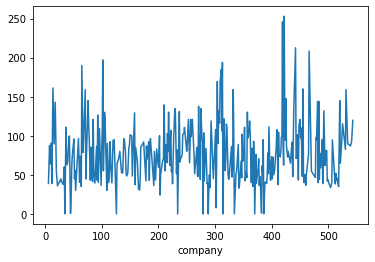

In [ ]:
df_hotel.groupby(["company"])["adr"].mean().plot()

In [ ]:
hotel_path = '/content/drive/MyDrive/Naya-Projects/Classification-project/hotel_bookings.csv'
df_hotel = pd.read_csv(hotel_path)

In [ ]:
from sklearn.pipeline import Pipeline
import datetime

class HotelTransFillNA():
    # def __init__(self, fillvalue=0):

    def transform(self, X, **transform_params):
        df_hotel = X.copy()
        # country is a 3 digit country code, fill na with "Unknown" string
        df_hotel.country.fillna("UNKNOWN", inplace=True)
        # agent is int id of the agent , fill na with 0
        df_hotel.agent.fillna(0, inplace=True)
        # company is int id of the company , fill na with 0
        df_hotel.company.fillna(0, inplace=True)
        # children is int id of num of children , fill na with 0
        df_hotel.children.fillna(0, inplace=True)
        df_hotel.children = df_hotel.children.astype(int)

        df_hotel["meal"].replace("Undefined", "SC", inplace=True)

        return df_hotel

    def fit(self, X, y=None, **fit_params):
        return self


class HotelTransCatToBoolean():
    # def __init__(self):

    def transform(self, X, **transform_params):
        df_hotel = X.copy()
        df_hotel.company = df_hotel.company > 0
        df_hotel.agent = df_hotel.agent > 0
        df_hotel.children = df_hotel.children > 0
        df_hotel.babies = df_hotel.babies > 0
        df_hotel.booking_changes = df_hotel.booking_changes > 0
        return df_hotel

    def fit(self, X, y=None, **fit_params):
        return self


class HotelTransFixFetureType():
    # def __init__(self):

    def transform(self, X, **transform_params):
        df_hotel = X.copy()
        categorical_features = ['hotel', 'arrival_date_week_number', 'meal', 'country', 'market_segment',
                                'distribution_channel', 'is_repeated_guest', 'reserved_room_type', 'assigned_room_type',
                                'deposit_type', 'customer_type', 'reservation_status', 'arrival_date_month','arrival_date_year']#
        df_hotel[categorical_features] = df_hotel[categorical_features].astype('str')
        df_hotel.adr = df_hotel.adr.astype('int')
        df_hotel.is_repeated_guest = df_hotel.is_repeated_guest.astype('bool')
        return df_hotel

    def fit(self, X, y=None, **fit_params):
        return self


def convert_month_text_to_int(month):
    return datetime.datetime.strptime(month, "%B").month


class HotelTransAddDayOfTheWeekFeture():
    # def __init__(self):

    def transform(self, X, **transform_params):
        df_hotel = X.copy()
        # df_hotel.arrival_date_month_number = df_hotel.arrival_date_month.apply(lambda x:datetime.strptime(x, "%B").month)
        df_hotel['arrival_date_month_number'] = df_hotel.arrival_date_month.apply(convert_month_text_to_int)
        # datetime_object = datetime.datetime.strptime(long_month_name, "%B")
        # add day of the week arrival
        from datetime import datetime
        df_hotel["arrival_day_of_week"] = df_hotel.apply(lambda x: datetime.strptime(
            "{0} {1} {2}".format(x['arrival_date_year'], x['arrival_date_month_number'],
                                 x['arrival_date_day_of_month']), "%Y %m %d").strftime('%A'), axis=1)
        df_hotel.drop(columns=['arrival_date_month_number'], inplace=True)
        return df_hotel

    def fit(self, X, y=None, **fit_params):
        return self


class HotelTransCleanErrorRows():
    # def __init__(self):

    def transform(self, X, **transform_params):
        df_hotel = X.copy()
        to_drop = df_hotel[(df_hotel['stays_in_weekend_nights'] == 0) & (df_hotel['stays_in_week_nights'] == 0)]
        df_hotel = df_hotel.drop(index=to_drop.index)

        zero_guests = list(df_hotel.loc[df_hotel["adults"]
                                        + df_hotel["children"]
                                        + df_hotel["babies"] == 0].index)
        df_hotel.drop(index=zero_guests, inplace=True, axis=0)
        return df_hotel

    def fit(self, X, y=None, **fit_params):
        return self


class HotelTransDropUnwantedFetures():
    # def __init__(self):

    def transform(self, X, **transform_params):
        df_hotel = X.copy()
        df_hotel.drop(['reservation_status_date', 'reservation_status', 'deposit_type'], axis=1, inplace=True)
        df_hotel.drop(['arrival_date_day_of_month', 'arrival_date_month'], axis=1, inplace=True)
        return df_hotel

    def fit(self, X, y=None, **fit_params):
        return self


class HotelTransGetDummies():
    # def __init__(self):

    def transform(self, X, **transform_params):
        df_hotel = X.copy()
        df_hotel = pd.get_dummies(data=df_hotel)
        df_hotel = df_hotel.reindex(columns=self.colNames, fill_value=0)
        # for a in self.colNames:
        #   print(a)
        return df_hotel

    def fit(self, X, y=None, **fit_params):
        df_temp = pd.get_dummies(data=X)
        self.colNames = df_temp.columns
        return self      




In [ ]:
  from sklearn.model_selection import train_test_split
  y=df_hotel['is_canceled']
  X = df_hotel.drop(['is_canceled'], axis=1)
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.30,random_state=40)

  #to_drop=X_train[(X_train['stays_in_weekend_nights']==0) & (X_train['stays_in_week_nights']==0)]

In [ ]:
from sklearn.preprocessing import MinMaxScaler

pipeline = Pipeline(steps=[
                          #('clean_error_row',HotelTransCleanErrorRows()),
                          ('fillna',HotelTransFillNA()),
                          ('cat_to_bool',HotelTransCatToBoolean()),
                          ('fix_feature_type',HotelTransFixFetureType()),
                          ('add_day_of_the_week',HotelTransAddDayOfTheWeekFeture()),
                          ('drop_unwanted_feature',HotelTransDropUnwantedFetures()),
                          ('get_dummies',HotelTransGetDummies()),
                          #('min_max_scaler',MinMaxScaler()),
                          ],verbose=True)
X_train = pipeline.fit_transform(X_train)

X_test = pipeline.transform(X_test)





[Pipeline] ............ (step 1 of 6) Processing fillna, total=   0.0s
[Pipeline] ....... (step 2 of 6) Processing cat_to_bool, total=   0.0s
[Pipeline] .. (step 3 of 6) Processing fix_feature_type, total=   0.4s
[Pipeline]  (step 4 of 6) Processing add_day_of_the_week, total=   3.9s
[Pipeline]  (step 5 of 6) Processing drop_unwanted_feature, total=   0.1s
[Pipeline] ....... (step 6 of 6) Processing get_dummies, total=   0.5s


In [ ]:
pd.DataFrame(X_train).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83573 entries, 0 to 83572
Columns: 301 entries, 0 to 300
dtypes: float64(301)
memory usage: 191.9 MB


In [ ]:
## final run of the chosen model
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix

# set the tolerance to a large value to make the example faster
rf = RandomForestClassifier()
pipe = Pipeline(steps=[("rf", rf)])

rf.fit(X_train, y_train)
y_pred= rf.predict(X_test)

cf_matrix = confusion_matrix(y_test, y_pred)
print(cf_matrix)


[[21311  1402]
 [ 2683 10421]]


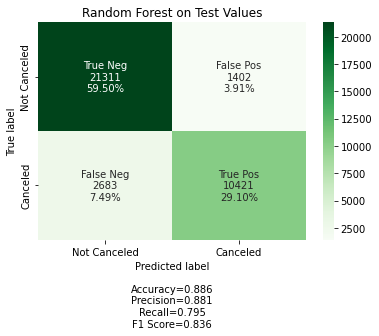

In [ ]:
labels = ["True Neg","False Pos","False Neg","True Pos"]
categories = ["Not Canceled", "Canceled"]
make_confusion_matrix(cf_matrix,group_names=labels,categories=categories,cmap="Greens", title="Random Forest on Test Values")

In [ ]:
# Import necessary packages
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import *

In [ ]:

# Initialze the estimators
clf1 = RandomForestClassifier(random_state=42)
clf2 = LogisticRegression(random_state=42)
clf3 = DecisionTreeClassifier(random_state=42)
clf4 = GradientBoostingClassifier(random_state=42)
# Initiaze the hyperparameters for each dictionary
param1 = {}
#param1['classifier__n_estimators'] = [10, 50, 100, 250]
#param1['classifier__max_depth'] = [5, 10, 20]
#param1['classifier__class_weight'] = [None, {0:1,1:5}, {0:1,1:10}, {0:1,1:25}]
param1['classifier'] = [clf1]


param2 = {}
#param3['classifier__C'] = [10**-2, 10**-1, 10**0, 10**1, 10**2]
#param3['classifier__penalty'] = ['l1', 'l2']
#param3['classifier__class_weight'] = [None, {0:1,1:5}, {0:1,1:10}, {0:1,1:25}]
param2['classifier'] = [clf2]

param3 = {}
#param4['classifier__max_depth'] = [5,10,25,None]
#param4['classifier__min_samples_split'] = [2,5,10]
#param4['classifier__class_weight'] = [None, {0:1,1:5}, {0:1,1:10}, {0:1,1:25}]
param3['classifier'] = [clf3]

param4 = {}
#param7['classifier__n_estimators'] = [10, 50, 100, 250]
#param7['classifier__max_depth'] = [5, 10, 20]
param4['classifier'] = [clf4]

pipeline = Pipeline([('classifier', clf1)])
params = [param1, param2, param3, param4]

gs = GridSearchCV(pipeline, params, cv=3, n_jobs=-1, scoring='roc_auc',verbose=10)
gs.fit(X_train, y_train)
joblib.dump(gs, 'gs3.pkl')


print("Best Params: " + str(gs.best_params_))

print("Best Score (roc_auc): " + str(gs.best_score_))

# Test data performance
print("Test Precision:",precision_score(gs.predict(X_test), y_test))
print("Test Recall:",recall_score(gs.predict(X_test), y_test))
print("Test ROC AUC Score:",roc_auc_score(gs.predict(X_test), y_test))

In [ ]:
X_trainVis, X_validVis, y_trainVis, y_validVis = train_test_split(X_train, y_train, test_size=.30,random_state=40)
# Instantiate the classfiers and make a list
classifiers =[RandomForestClassifier(random_state=42), LogisticRegression(random_state=42), DecisionTreeClassifier(random_state=42), GradientBoostingClassifier(random_state=42)]

# Define a result table as a DataFrame
result_table = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])
labels = ["True Neg","False Pos","False Neg","True Pos"]
categories = ["Not Canceled", "Canceled"]

# Train the models and record the results
for cls in classifiers:
    pipe = Pipeline(steps=[("cls", cls)])
    model = cls.fit(X_trainVis, y_trainVis)
    yproba = model.predict_proba(X_validVis)[::,1]
    
    fpr, tpr, _ = roc_curve(y_validVis,  yproba)
    auc = roc_auc_score(y_validVis, yproba)
    print("auc: " + str(auc))
    result_table = result_table.append({'classifiers':cls.__class__.__name__,
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':auc}, ignore_index=True)
    
    y_pred = model.predict(X_validVis)
    cf_matrix = confusion_matrix(y_validVis, y_pred)
    print(cf_matrix)
    make_confusion_matrix(cf_matrix,group_names=labels,categories=categories, title=cls.__class__.__name__)
# Set name of the classifiers as index labels
result_table.set_index('classifiers', inplace=True)

auc: 0.9240390761080745
[[14632  1071]
 [ 2412  6957]]


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


auc: 0.8370296614958284
[[13696  2007]
 [ 3496  5873]]
auc: 0.8039627231134352
[[13286  2417]
 [ 2263  7106]]
auc: 0.8763235318977066
[[14453  1250]
 [ 3565  5804]]


In [ ]:
fig = plt.figure(figsize=(8,6))

for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))
    
plt.plot([0,1], [0,1], color='orange', linestyle='--')

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("Flase Positive Rate", fontsize=15)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15)

plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')

plt.show()

In [ ]:
##compare models
from sklearn.metrics import confusion_matrix

clf1 = RandomForestClassifier(random_state=42)
clf2 = LogisticRegression(random_state=42)
clf3 = DecisionTreeClassifier(random_state=42)
clf4 = GradientBoostingClassifier(random_state=42)
labels = ["True Neg","False Pos","False Neg","True Pos"]
categories = ["Not Canceled", "Canceled"]

pipe = Pipeline(steps=[("clf1", clf1)])
param_grid = {}
search = GridSearchCV(pipe, param_grid,scoring='roc_auc', cv=3, n_jobs=-1)
search.fit(X_train, y_train)
y_pred = search.best_estimator_.predict(X_train)

print("Best Score (roc_auc): " + str(search.best_score_))
cf_matrix = confusion_matrix(y_train, y_pred)
print(cf_matrix)
make_confusion_matrix(cf_matrix,group_names=labels,categories=categories)



Best Params: {}
Best Score (roc_auc): 0.9476627718140431
[[52342   111]
 [  204 30916]]


In [ ]:
for i in range(2):
  labels = ["True Neg","False Pos","False Neg","True Pos"]
  categories = ["Not Canceled", "Canceled"]
  make_confusion_matrix(cf_matrix,group_names=labels,categories=categories)


In [ ]:

from sklearn.model_selection import train_test_split
import datetime
def convert_month_text_to_int(month):
  return datetime.datetime.strptime(month, "%B").month

  # df_hotel.arrival_date_month = df_hotel.arrival_date_month.apply(convert_month_text_to_int)
  # #datetime_object = datetime.datetime.strptime(long_month_name, "%B")
  ## converting company id to "is-comapny" - true false
  df_hotel.company = df_hotel.company!='UNKNOWN'
  ## converting agent id to "is ordered with agent" - true false
  df_hotel.agent = df_hotel.agent!='UNKNOWN'
  ## create transformers :
  # country is a 3 digit country code, fill na with "Unknown" string
  df_hotel.country.fillna("UNKNOWN",inplace=True)
  #agent is int id of the agent , fill na with 0
  df_hotel.agent.fillna(0,inplace=True)
  #company is int id of the company , fill na with 0
  df_hotel.company.fillna(0,inplace=True)
  #children is int id of num of children , fill na with 0
  df_hotel.children.fillna(0,inplace=True)
  df_hotel.children[df_hotel.children == 'UNKNOWN'] = 0
  df_hotel.children = df_hotel.children.astype(int)



  #fix negative adr
  df_hotel.loc[df_hotel.adr<0,'adr'] = 0
  #converting the required object type feature to categorical
  categorical_features = ['hotel','arrival_date_week_number','meal','country','market_segment',
                          'distribution_channel','is_repeated_guest','reserved_room_type','assigned_room_type',
                          'deposit_type','agent','customer_type','reservation_status','arrival_date_month']
  df_hotel[categorical_features]=df_hotel[categorical_features].astype('str')
  df_hotel.adr=df_hotel.adr.astype('int')

  # df_hotel.arrival_date_month = df_hotel.arrival_date_month.apply(convert_month_text_to_int)
  # #datetime_object = datetime.datetime.strptime(long_month_name, "%B")
  # # add day of the week arrival
  # from  datetime import datetime
  # df_hotel["arraival_date"] = df_hotel.apply(lambda x:datetime.strptime("{0} {1} {2}".format(x['arrival_date_year'],x['arrival_date_month'], x['arrival_date_day_of_month']), "%Y %m %d").strftime('%A'),axis=1)


  df_hotel["is_booking_changed"] = df_hotel.booking_changes >0
  df_hotel.drop(labels= ["booking_changes"], axis=1,inplace=True)


  y=df_hotel['is_canceled']
  X = df_hotel.drop(['is_canceled']
  X_dum=pd.get_dummies(X,prefix_sep='-',drop_first=True)
  X_train,X_test,y_train,y_test= train_test_split(X_dum,y, test_size=.30,random_state=40)




SyntaxError: ignored

In [ ]:
def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
  # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sns.heatmap(cf,annot=box_labels,fmt="",cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories)

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label' + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)